<a href="https://colab.research.google.com/github/UriGOPAR/Pyspark-Big_Data/blob/main/Pyspark_Uri_Gopar_A01709413.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CLASIFICADOR DE HONGOS POR MEDIO DE PYSPARK y TABLEU

---
***by Uri Jared Gopar Morales A01709413***


## **INTRODUCCION**

---

En este proyecto se desarrolló un clasificador cuyo objetivo es identificar diferentes especies de hongos de manera rápida y precisa, ayudando a reducir el margen de error humano en la identificación de dichas especies. La clasificación automática de hongos es especialmente valiosa en aplicaciones como la biología y la seguridad alimentaria, ya que permite identificar especies potencialmente peligrosas o tóxicas sin depender de la percepción humana, que está sujeta a errores.

---

### **DATASET**

---

Para desarrollar este modelo con éxito, utilicé un dataset proveniente de la plataforma **Kaggle**, creado por *lizhecheng*. Este dataset contiene imágenes de 9 especies de hongos (Agaricus, Boletus, Cortinarius, Entoloma, Exidia, Hygrocybe, Inocybe, Lactarius, Russula y Suillus), que sirven como referencia para el entrenamiento del modelo. Cabe aclarar que el dataset tiene un tamaño aproximado de 1.2 GB y contiene entre 400 y 500 imágenes por cada especie de hongo.

Link para la libreta de Kaggle: [Mushroom Classification Dataset](https://www.kaggle.com/datasets/lizhecheng/mushroom-classification?select=archive).


---

### **PYSPARK**

---

Se utilizo la herramienta de Pyspark en Google Colab ya que al ser un dataset con un gran tamano de datos nos proporciona varias ventajas:

- **Escalabilidad:** Utiliza un modelo de procesamiento distribuido, el cual divide las tareas en varias partes, esto ayuda para el procesamiento de grande cantidades de datos.

- **Velocidad de procesamiento:** Permite realizar operaciones en paralelo, lo que reduce significativamente el tiempo de computo en comparacion con el procesamiento secuencial.

- **Tolerancia a fallos:** Utiliza el Concepto de Resilient Distributes Dataset (RDDs), son estructuras de datos distribuidas capaces de reconstruir automaticamente los datos perdidos en caso de fallo.

- **Alta disponibilidad:** Tiene la capacidad de agregar o quitar nodos en el cluster sin afectar el procesimiento permite mantener una alta disponibilidad y ajustar los recursos de manera eficiente.





## **CREACION DEL MODELO**

---

En el primer bloque de codigo configuramos un entorno de trabajo para trabajar con Pyspark.

In [ ]:
#Bibliotecas para poder trabajar con Spark
!sudo apt update
!apt-get install openjdk-8-jdk-headless -qq > /dev/null
!wget -q https://downloads.apache.org/spark/spark-3.5.3//spark-3.5.3-bin-hadoop3.tgz
!tar xf spark-3.5.3-bin-hadoop3.tgz
#Configuración de Spark con Python
!pip install -q findspark
!pip install pyspark

#Estableciendo variable de entorno
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.5.3-bin-hadoop3"

#Buscando e inicializando la instalación de Spark
import findspark
findspark.init()
findspark.find()

#Probando PySparl
from pyspark.sql import DataFrame, SparkSession
from typing import List
import pyspark.sql.types as T
import pyspark.sql.functions as F

spark = SparkSession.builder \
        .appName("Mushrooms Dataset") \
        .config("spark.executor.memory", "8g") \
        .config("spark.driver.memory", "8g") \
        .config("spark.sql.shuffle.partitions", "50") \
        .getOrCreate()
spark

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
52 packages can be upgraded. Run 'apt list --upgradable' to see them.
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InR

### **EXPLORACION DE DATOS**

---

Para la exploración de los datos del dataset, conecté Google Colab a mi Drive ya que en este se encuentra almacenado el dataset.

---
**EXPLICACION**

---
Este código recorre cada carpeta de tipos de hongos y muestra hasta 10 imágenes por carpeta en una fila horizontal de subplots en Google Colab, lo que permite una fácil inspección visual del contenido de cada carpeta.

---
**OBSERVACIONES**

---

Al realizar esta actividad, pude observar que este dataset contenía datos inservibles, los cuales, en lugar de aportar información valiosa, ocasionarían resultados erróneos.

Algunos de estos casos fueron:

- Las imágenes contenían diferentes tamaños y resoluciones.
- Algunas de las imágenes estaban dañadas o manipuladas para que no se observara nada.
- Contenía imágenes que solo mostraban el tallo del hongo.
- Algunas carpetas contenían imágenes de microscopios.
- Los hongos se veían partidos a la mitad.
- Las imágenes contienen mucho ruido, causando que el hongo casi no se distinga.
- Existían imágenes que mostraban el hongo en descomposición.
- Fotos tomadas de diferentes angulos y con diferente iluminacion.

---
**SOLUCIONES**

---

Como podemos observar, estas imágenes afectarían considerablemente las predicciones del modelo. Para mejorar la calidad del dataset, realicé una clasificación manual, seleccionando únicamente las imágenes que aportaban valor y descartando aquellas que no, cabe aclar que utilice diferentes especies de hongos las cuales ahora fueron*(Amanita, Boletus, Calocera,Calycina citrina,Leccinum versipelle,Nectrina,Parmelia sulcata,Phallus impudicus,Trametes versicolor)*. Al finalizar este proceso de clasificación, obtuve un total de 4,000 imágenes distribuidas entre las 9 especies de hongos. Mediante la herramienta de Tableu realice una grafica la cual me ayudara para observar la distribucion de la cantidad de imagenes que hay por especie despues de haber realizado la clasificacion de imagenes, esto para analizar con cuantos datos estare trabajando.




In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Mostrando imágenes de la carpeta: Agaricus


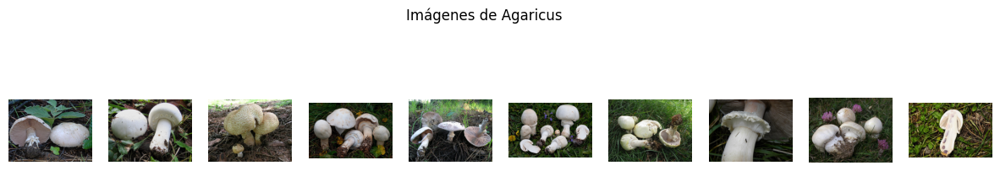

Mostrando imágenes de la carpeta: Amanita


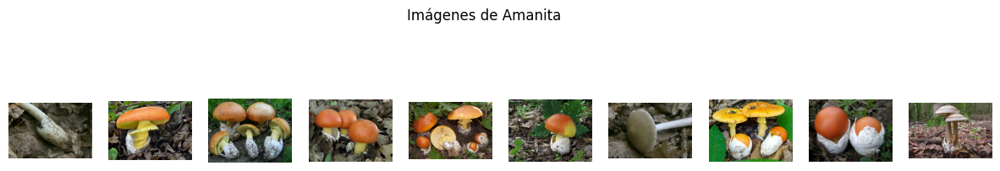

Mostrando imágenes de la carpeta: Boletus


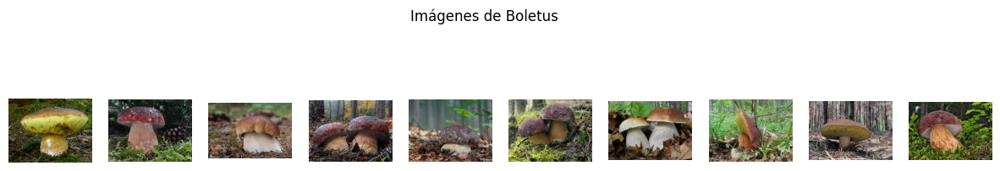

Mostrando imágenes de la carpeta: Cortinarius


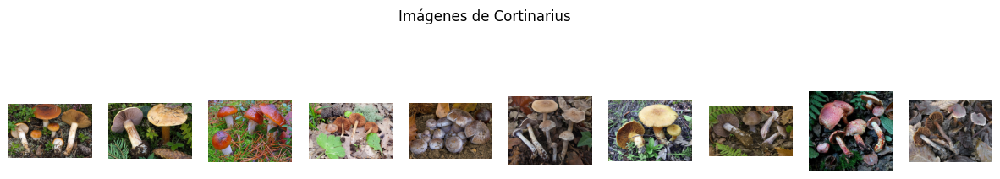

Mostrando imágenes de la carpeta: Entoloma


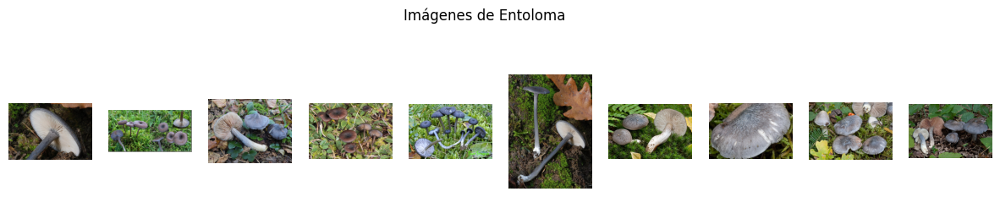

Mostrando imágenes de la carpeta: Exidia


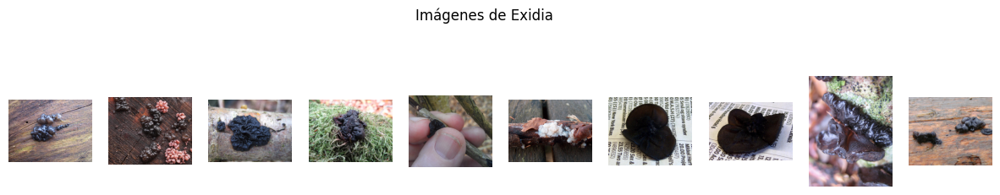

Mostrando imágenes de la carpeta: Hygrocybe


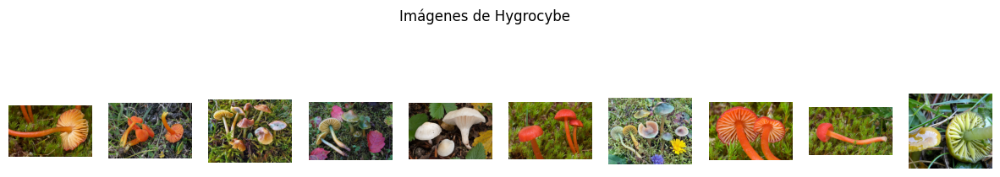

Mostrando imágenes de la carpeta: Inocybe


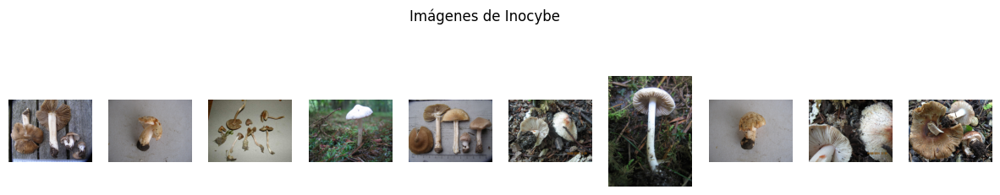

Mostrando imágenes de la carpeta: Lactarius


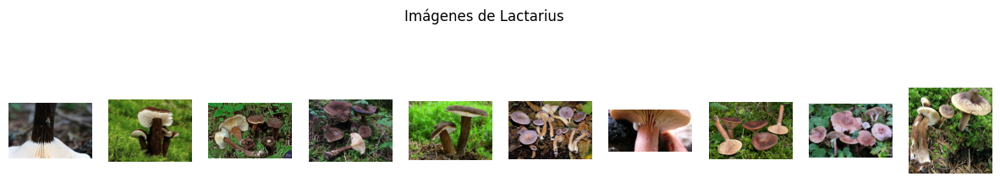

Mostrando imágenes de la carpeta: Russula


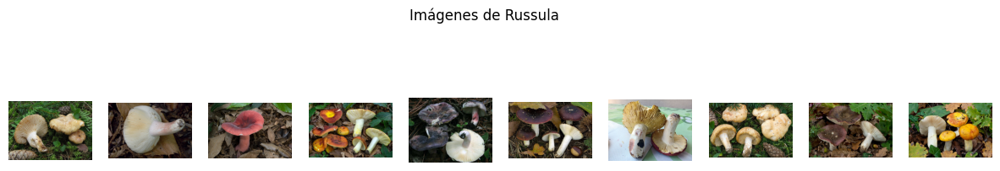

Mostrando imágenes de la carpeta: Suillus


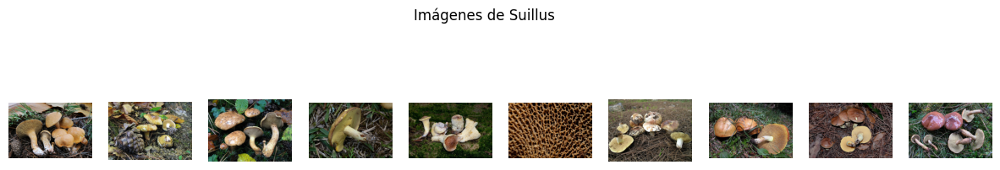

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Ruta base donde se encuentran las imágenes en Google Drive
base_path = "/content/drive/MyDrive/Data/Mushrooms"
# Diccionario de etiquetas
label_mapping = {
    "Agaricus": 0,
    "Amanita": 1,
    "Boletus": 2,
    "Cortinarius": 3,
    "Entoloma": 4,
    "Exidia": 5,
    "Hygrocybe": 6,
    "Inocybe": 7,
    "Lactarius": 8,
    "Russula": 9,
    "Suillus": 10
}
num_images_per_folder = 10

# Mostrar imágenes de cada carpeta
for folder_name in label_mapping.keys():
    folder_path = os.path.join(base_path, folder_name)
    images_shown = 0
    print(f"Mostrando imágenes de la carpeta: {folder_name}")

    # Crear una fila de subplots para mostrar las imágenes en una fila
    fig, axes = plt.subplots(1, num_images_per_folder, figsize=(15, 3))
    fig.suptitle(f"Imágenes de {folder_name}")

    # Recorre los archivos de imagen en la carpeta
    for i, image_file in enumerate(os.listdir(folder_path)):
        if image_file.endswith(".jpg") or image_file.endswith(".png"):
            image_path = os.path.join(folder_path, image_file)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


            axes[i].imshow(image)
            axes[i].axis('off')
            images_shown += 1


            if images_shown >= num_images_per_folder:
                break

    plt.show()


**OBSERVACION DE LAS IMAGENES DESPUES DEL PROCESO DE CALSIFICACION**

Mostrando imágenes de la carpeta: Amanita


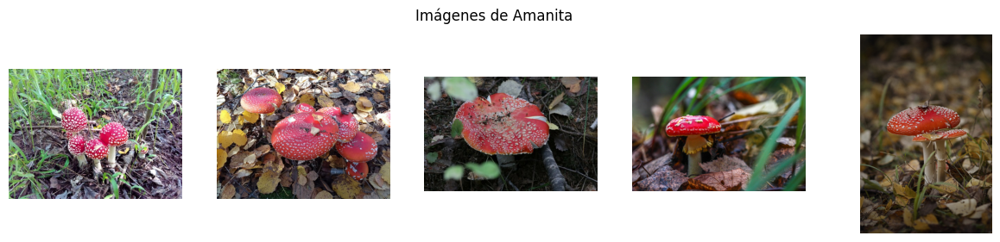

Mostrando imágenes de la carpeta: Boletus


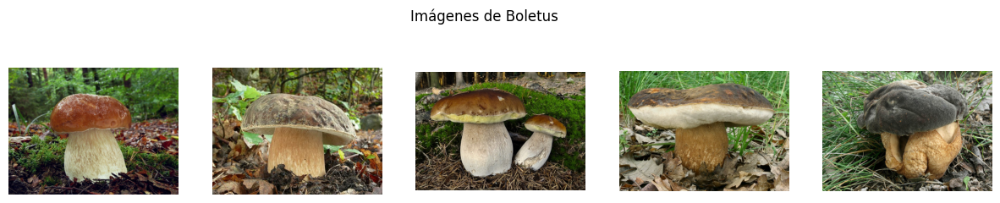

Mostrando imágenes de la carpeta: Calocera


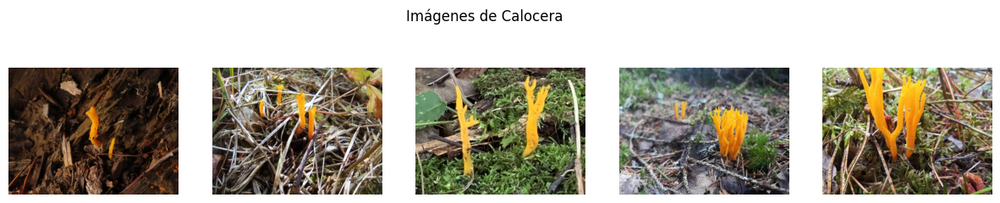

Mostrando imágenes de la carpeta: Calycina_citrina


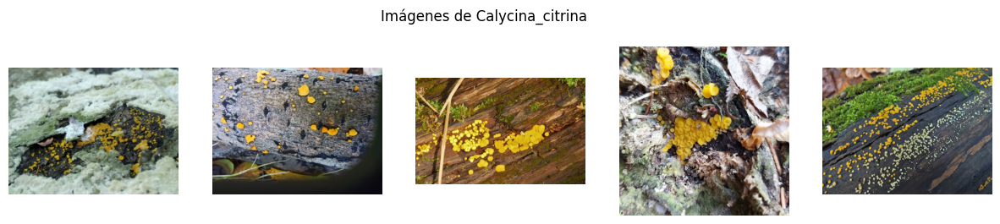

Mostrando imágenes de la carpeta: Leccinum_versipelle


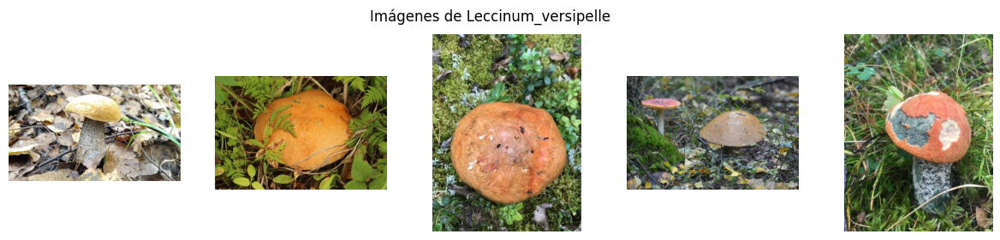

Mostrando imágenes de la carpeta: Nectrina


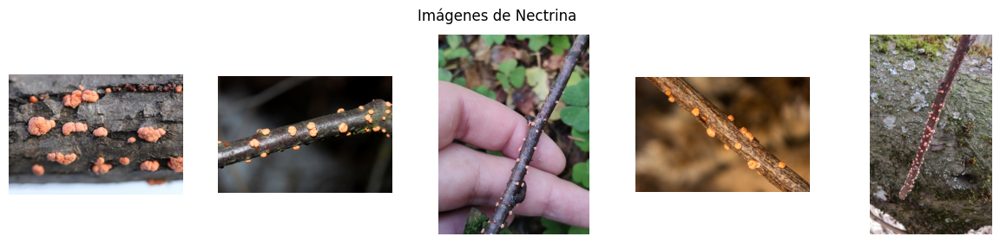

Mostrando imágenes de la carpeta: Parmelia_sulcata


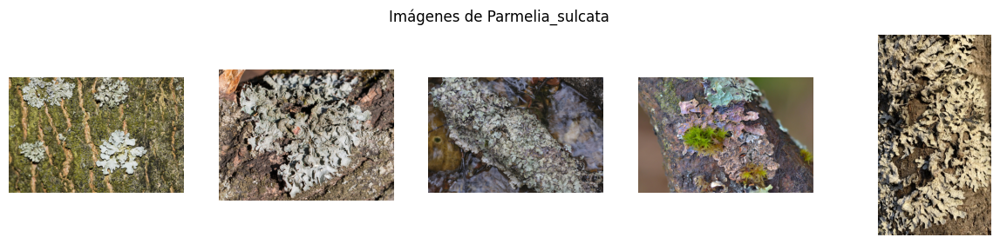

Mostrando imágenes de la carpeta: Phallus_impudicus


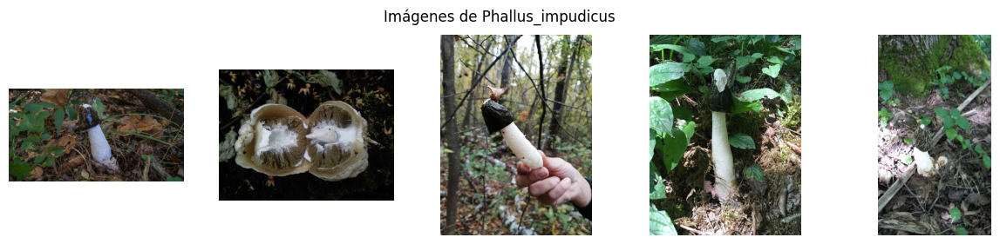

Mostrando imágenes de la carpeta: Trametes_versicolor


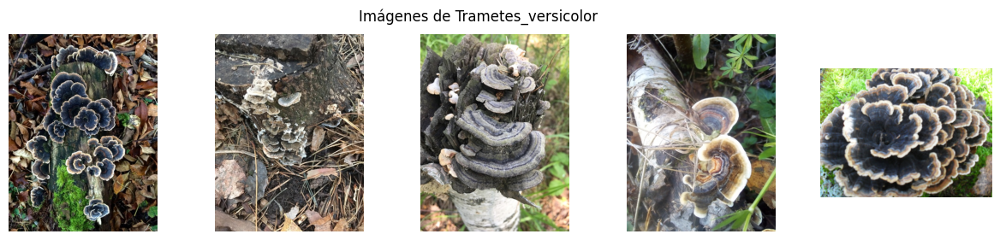

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Ruta base donde se encuentran las imágenes en Google Drive
base_path = "/content/drive/MyDrive/Data/Mushrooms_2"
# Diccionario de etiquetas
label_mapping = {
    "Amanita": 0,
    "Boletus": 1,
    "Calocera": 2,
    "Calycina_citrina": 3,
    "Leccinum_versipelle": 4,
    "Nectrina": 5,
    "Parmelia_sulcata": 6,
    "Phallus_impudicus": 7,
    "Trametes_versicolor": 8
}
num_images_per_folder = 5

# Mostrar imágenes de cada carpeta
for folder_name in label_mapping.keys():
    folder_path = os.path.join(base_path, folder_name)
    print(f"Mostrando imágenes de la carpeta: {folder_name}")

    image_files = [img for img in os.listdir(folder_path) if img.endswith(".jpg") or img.endswith(".png") or img.endswith(".jpeg")][:num_images_per_folder]


    fig, axes = plt.subplots(1, len(image_files), figsize=(15, 3))
    fig.suptitle(f"Imágenes de {folder_name}")


    if len(image_files) == 1:
        axes = [axes]

    # Mostrar cada imagen en los subplots
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        axes[i].imshow(image)
        axes[i].axis('off')

    plt.show()


**TOTAL DE IMAGENES EN EL DATASET POR MEDIO DE TABLEU**

---

Observamos en estas graficas que me quede con un total de 4,000, las cuales aportaran un valor para el funcionamiento del modelo, tambien podemos obvesar que dentro de esas 4,000, todas las especies cuentan con casi la misma cantidad que seria entre 400 a 500 imagenes, lo que nos permitira trabajar sin algun sesgo de informacion, la que menos imagenes contiene es de 298, sin embargo, no afectara mucho al entrenamiento del modelo, devido a que es la especie de hongo que mas se diferencia de las demas (NECTRINA).

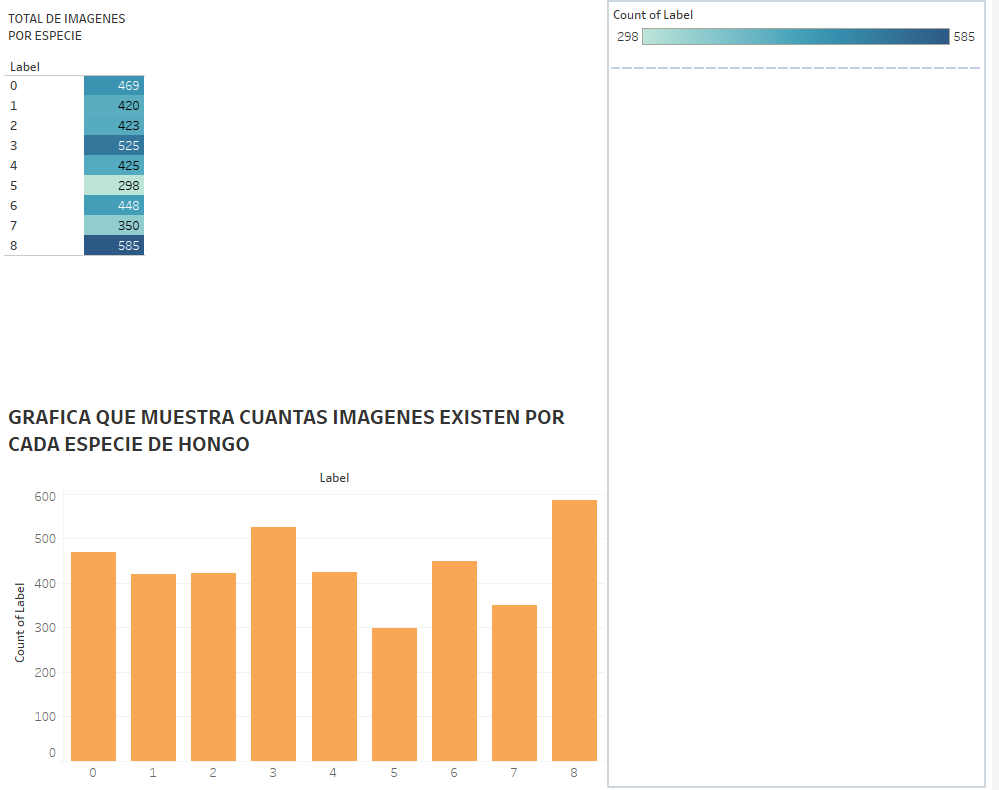

### **FASE DE ANALISIS**

---


En el siguiente bloque de codigo utilizando las herramientas de Pyspark converti mi conjunto de imagenes de hongos en vectores densos, y los fui etiquetando segun su clase (su carpeta correspondiente), los fui almacenandolos en un dataFrame de Pyspark, para despues exportarlo en un csv. Lo que me permite aprovechar la capacidad de procesamiento distribuido de Spark para manejar grandes volumenes de datos de imagen.

---
Las herramientas que utilice para esto fueron las siguientes:

+ **pyspark.ml.linalg.Vectors:** Se utiliza para representar los vectores densos.

+ **pyspark.sql.types.IntegerType:** Tipo de dato de Spark que se usa para especificar el tipo de columna (en este caso, las etiquetas de los hongos).

+ **pyspark.sql.functions.udf:** Se usa para definir funciones definidas por el usuario (UDF), permitiendo crear funciones personalizadas que operan sobre columnas del DataFrame.

+ **cv2 (OpenCV):** Biblioteca usada para el procesamiento de imágenes, en este caso para cargar, redimensionar y convertir las imágenes en vectores.

---

**ANALISIS**

---

Como primer paso, convertí todas las imágenes a un tamaño uniforme de 64x64, lo cual asegura que el tamaño de cada vector sea de 12,288 por los canales de colores RGB, generando uniformidad en el conjunto de datos. Al conservar el color, se enriquece el procesamiento, permitiendo que el modelo capture más características específicas de cada especie, dado que en la clasificación de hongos el color juega un papel muy importante.

Como segundo paso converti las imagenes en vectores densos, esto para que Pyspark pueda realizar calculos de los datos de manera eficiente, permitiendo el uso directo de estos datos para algoritmos de clasificacion.

Despues almaceno los datos en un DataFrame por lo que estoy aprovechando las capacidades de procesamiento paralelo con las que Pyspark cuenta y esto es esencial para un proyecto de bigdata.


Al realizar el mapping de las etiquetas en el DataFrame junto a sus vectores me permitio integrar el conjunto de datos de imágenes directamente en mi modelo de clasificación sin necesidad de un preprocesamiento adicional para etiquetar.


Para guardar estos vectores en un archivo CSV, se convierte cada vector en una cadena de texto. Esto hace que los datos sean legibles y reutilizables en otras herramientas y plataformas, en este caso como Tableu.

La capacidad de PySpark para manejar y procesar grandes volúmenes de datos distribuidos permite que este conjunto de datos de imágenes pueda ser procesado rápidamente, independientemente de su tamaño.


In [ ]:
from pyspark.ml.linalg import Vectors
from pyspark.sql import Row
import os
import numpy as np
from pyspark.sql.types import IntegerType
from pyspark.sql.functions import udf
from pyspark.ml.feature import VectorAssembler
import cv2


def image_to_vector(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    # Resize the image to a fixed size (e.g., 64x64) to ensure consistency in vector length
    resized_image = cv2.resize(image, (64, 64))
    image_vector = resized_image.flatten()
    return Vectors.dense(image_vector)


base_path = "/content/drive/MyDrive/Data/Mushrooms_2"


image_data = []

# Dictionary to map folder names to numeric labels
label_mapping = {
    "Amanita": 0,
    "Boletus": 1,
    "Calocera": 2,
    "Calycina_citrina": 3,
    "Leccinum_versipelle": 4,
    "Nectrina": 5,
    "Parmelia_sulcata": 6,
    "Phallus_impudicus": 7,
    "Trametes_versicolor": 8
}

for folder_name, label in label_mapping.items():
    folder_path = os.path.join(base_path, folder_name)
    for image_file in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_file)
        if image_file.endswith(".jpg") or image_file.endswith(".png") or image_file.endswith(".jpeg"):

            image_vector = image_to_vector(image_path)
            image_data.append((image_vector, label))

image_df = spark.createDataFrame(image_data, ["features", "label"])


image_df.select("features", "label").show(truncate=False)


image_df.printSchema()

from pyspark.sql.functions import udf, col
from pyspark.sql.types import StringType


def vector_to_string(vector):
    return ','.join([str(x) for x in vector.toArray()])


vector_to_string_udf = udf(vector_to_string, StringType())


image_df = image_df.withColumn("features_string", vector_to_string_udf(col("features")))


image_df_to_save = image_df.select("features_string", "label")


output_path = "/content/drive/MyDrive/Data/image_vectors.csv"


image_df_to_save.coalesce(1).write.csv(output_path, header=True)

print(f"Dataset guardado en {output_path}")


+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

### **DIVIDIR EL DATAFRAME**

---
En este parte del codigo fraccione el dataset en 3 partes las cuales fueron Train, Validetion y Test.

- **TRAIN:** Este subconjunto es el más grande de los tres y se utiliza para ajustar los parámetros internos del modelo, permitiéndole aprender las características de las especies de hongos. Contiene un total de 2,395 imágenes, lo que equivale al 60% del conjunto de datos.

- **VALIDETION:** Este conjunto se utiliza para evaluar el modelo mientras se entrena, pero sin actualizar los parámetros internos. Es una prueba intermedia para medir el rendimiento del modelo y permite observar si presenta overfitting o underfitting. Contiene un total de 809 imágenes, lo que equivale al 20% del conjunto de datos.

- **TEST:** Por último, tenemos el conjunto de prueba, que mide el rendimiento final del modelo con datos nunca antes vistos. Esto simula una situación real, y para este conjunto se utilizaron un total de 739 imágenes, lo que equivale al 20% del conjunto de datos.

---

**ANALISIS**

---

La razón por la que decidí dividir el conjunto de datos de esta manera y no mediante validación cruzada fue porque, al contar con un conjunto de datos significativamente grande, dispongo de los recursos necesarios para entrenar el modelo de manera eficiente, reservando los conjuntos de validación y prueba para evaluar su rendimiento en situaciones reales. Además, esta distribución ayuda a equilibrar el riesgo de sesgo y varianza en el modelo.


In [ ]:
train_df, validation_df, test_df = image_df.randomSplit([0.6, 0.2, 0.2], seed=42)


print("Training set size: ", train_df.count())
print("Validation set size: ", validation_df.count())
print("Test set size: ", test_df.count())


print("Train Dataset Example:")
train_df.select("features", "label").show(5, truncate=False)

print("Validation Dataset Example:")
validation_df.select("features", "label").show(5, truncate=False)

print("Test Dataset Example:")
test_df.select("features", "label").show(5, truncate=False)


Training set size:  2395
Validation set size:  809
Test set size:  739
Train Dataset Example:
+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

**GRAFICAS EN TABLEU**

---

En el siguiente codigo exporte mi dataset como un csv con las divisiones de train,validetion y test. Esto con el objetivo para que sean mas faciles representarlas en otra aplicacion en este caso tableu.


In [ ]:
from pyspark.sql import functions as F

# Añadir la columna 'set_type' a cada DataFrame
train_df = train_df.withColumn("set_type", F.lit("train"))
validation_df = validation_df.withColumn("set_type", F.lit("validation"))
test_df = test_df.withColumn("set_type", F.lit("test"))

# Seleccionar solo las columnas necesarias y compatibles para el CSV
train_df = train_df.select("features_string", "label", "set_type")
validation_df = validation_df.select("features_string", "label", "set_type")
test_df = test_df.select("features_string", "label", "set_type")

# Unir los DataFrames en uno solo
full_df = train_df.union(validation_df).union(test_df)

# Combinar todas las particiones en una sola
full_df = full_df.coalesce(1)

# Guardar el DataFrame completo en un solo archivo CSV en la ruta especificada
full_df.write.csv("/content/drive/MyDrive/Data/dataset_split.csv", header=True, mode="overwrite")


**GRAFICAS TABLEU**

---

En estas graficas se representa como quedo la distribucion de los datos en los 3 subconjuntos de train,validetion y test.

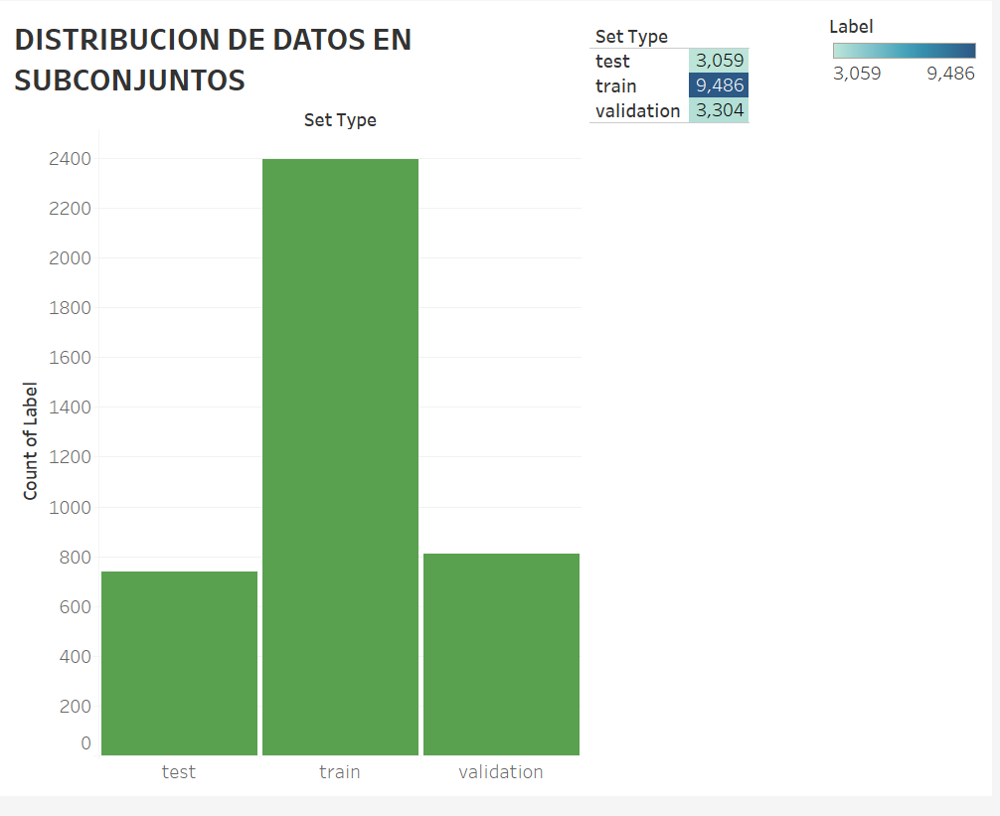

## ENTRENAMIENTO DEL MODELO

En este fragmento de codigo entrena con un modelo de Regresion logistica multinomial usando Pyspark para clasificar las imagenes de hongos usando vectores, luego, evalúa la precisión (accuracy) del modelo en los conjuntos de entrenamiento, validación y prueba, y finalmente visualiza los resultados en un gráfico de barras

---
**FUNCIONES**

---


**VectorAssembler:** Se crea un ensamblador de vectores que toma la columna features (donde cada fila es un vector denso) y la convierte en una nueva columna features_vector. La Regresión Logística en Pyspark requieren que las características estén en una columna de tipo vector.

**assembler.transform():** Aplica la transformación a los tres subconjuntos de datos (train, validation y test), agregando la columna features_vector en cada uno de ellos.

**LogisticRegression:** Define el modelo de Regresión Logística multinomial.
featuresCol="features_vector": Especifica que las características para el modelo se encuentran en la columna features_vector.
labelCol="label": La columna label contiene las etiquetas (clases de los hongos) que el modelo tratará de predecir.
family="multinomial": Especifica que estamos trabajando con un problema de clasificación multiclase (multinomial).


**MulticlassClassificationEvaluator:**
Se crea un evaluador para medir la precisión del modelo.
labelCol="label": Especifica la columna que contiene las etiquetas verdaderas.
predictionCol="prediction": Especifica la columna que contiene las predicciones generadas por el modelo.
metricName="accuracy": Define que la métrica a evaluar será la precisión del modelo.



**lr.fit(train_df):** Entrena el modelo de Regresión Logística usando el conjunto de entrenamiento (train_df).
evaluator.evaluate(lr_model.transform(...)):
Evalúa la precisión del modelo en cada uno de los conjuntos (entrenamiento, validación y prueba) aplicando el modelo con lr_model.transform(). Esto genera las predicciones en base a los vectores de características.

---
**ANALISIS**

---

El modelo se entrena para encontrar una relación entre las características de las imágenes y sus etiquetas (clases de hongos). Se usa regresión logística multinomial por ser una técnica eficiente para problemas de clasificación multiclase y se implementa en PySpark para aprovechar su capacidad de procesamiento y optimización en entornos de big data.



Accuracy on Train data = 1.0
Accuracy on Validation data = 0.415327564894932
Accuracy on Test data = 0.41948579161028415
Train predictions saved to /content/drive/MyDrive/Data/train_predictions.csv
Validation predictions saved to /content/drive/MyDrive/Data/validation_predictions.csv
Test predictions saved to /content/drive/MyDrive/Data/test_predictions.csv


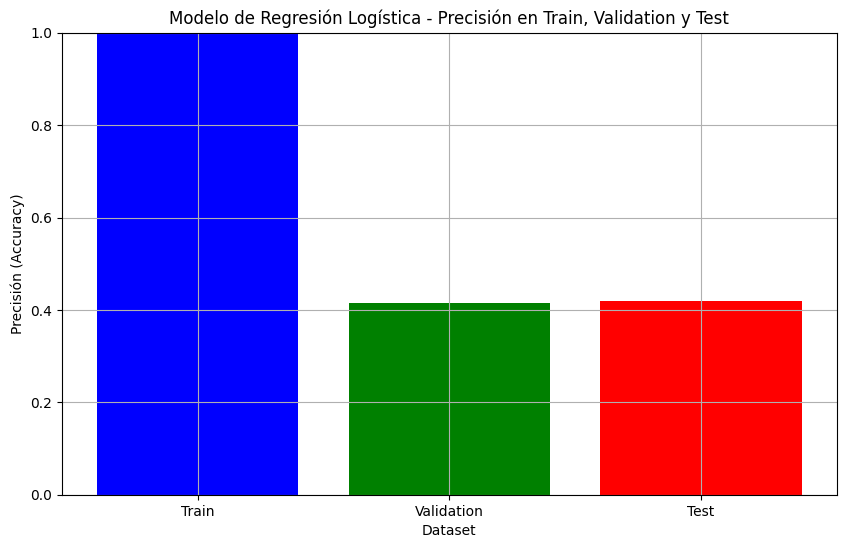

In [ ]:
# Assemble the features vector for model input
assembler = VectorAssembler(inputCols=["features"], outputCol="features_vector")
train_df = assembler.transform(train_df)
validation_df = assembler.transform(validation_df)
test_df = assembler.transform(test_df)

# Train Logistic Regression Model
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

lr = LogisticRegression(featuresCol="features_vector", labelCol="label", family="multinomial")

# Evaluator for measuring accuracy
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")

# Fit the model
lr_model = lr.fit(train_df)

# Evaluate model on train, validation, and test sets
train_predictions = lr_model.transform(train_df)
validation_predictions = lr_model.transform(validation_df)
test_predictions = lr_model.transform(test_df)

# Calculate accuracy
train_accuracy = evaluator.evaluate(train_predictions)
validation_accuracy = evaluator.evaluate(validation_predictions)
test_accuracy = evaluator.evaluate(test_predictions)

print(f"Accuracy on Train data = {train_accuracy}")
print(f"Accuracy on Validation data = {validation_accuracy}")
print(f"Accuracy on Test data = {test_accuracy}")

from pyspark.sql.functions import udf
from pyspark.sql.types import StringType

# Definir la UDF para convertir el vector a una cadena
def vector_to_string(vector):
    return ','.join([str(x) for x in vector.toArray()])

vector_to_string_udf = udf(vector_to_string, StringType())

# Aplicar la UDF para convertir la columna 'features' a cadena
train_predictions = train_predictions.withColumn("features_string", vector_to_string_udf(train_predictions["features"]))
validation_predictions = validation_predictions.withColumn("features_string", vector_to_string_udf(validation_predictions["features"]))
test_predictions = test_predictions.withColumn("features_string", vector_to_string_udf(test_predictions["features"]))

# Exportar predicciones a CSV (incluyendo la columna 'features_string')
train_output_path = "/content/drive/MyDrive/Data/train_predictions.csv"
train_predictions.select("features_string", "label", "prediction").coalesce(1).write.csv(train_output_path, header=True)

validation_output_path = "/content/drive/MyDrive/Data/validation_predictions.csv"
validation_predictions.select("features_string", "label", "prediction").coalesce(1).write.csv(validation_output_path, header=True)

test_output_path = "/content/drive/MyDrive/Data/test_predictions.csv"
test_predictions.select("features_string", "label", "prediction").coalesce(1).write.csv(test_output_path, header=True)

print(f"Train predictions saved to {train_output_path}")
print(f"Validation predictions saved to {validation_output_path}")
print(f"Test predictions saved to {test_output_path}")


# Plot accuracy results
import matplotlib.pyplot as plt

datasets = ['Train', 'Validation', 'Test']
accuracies = [train_accuracy, validation_accuracy, test_accuracy]

plt.figure(figsize=(10, 6))
plt.bar(datasets, accuracies, color=['blue', 'green', 'red'])

plt.title('Modelo de Regresión Logística - Precisión en Train, Validation y Test')
plt.xlabel('Dataset')
plt.ylabel('Precisión (Accuracy)')
plt.ylim(0, 1)
plt.grid(True)
plt.show()

## Predicciones vs valores reales tableu

---


En la gráfica podemos observar las predicciones del modelo en comparación con los valores reales. Aunque las gráficas son ligeramente similares, nuestro modelo alcanzó una precisión del 41% en todo el conjunto de datos. Esto nos sugiere posibles enfoques para mejorar el modelo, como probar con otro tipo de clasificación, como una red neuronal, o aumentar el número de épocas en el entrenamiento, entre otras opciones.


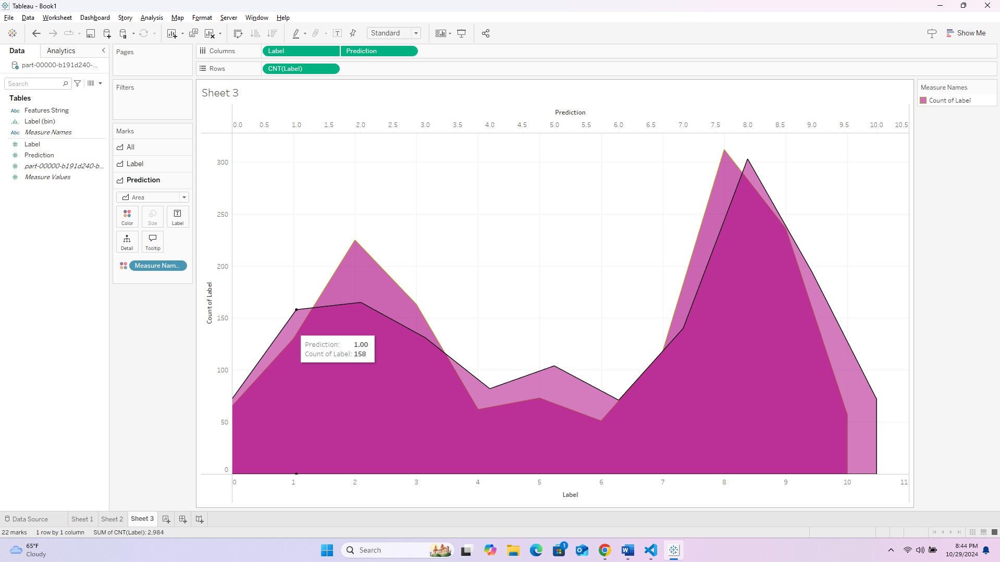

**REFLEXION**

---

Aprendi que PySpark es una herramienta ideal cuando se trabaja con bigdata, ya que excede la capacidad de procesamiento de una sola máquina, permite distribuir y paralelizar el procesamiento de datos en un clúster de computadoras.

Al momento de usar PySpark  me percate lo beneficioso que es en proyectos donde se manejan grandes volúmenes de datos en tiempo real como en este caso fue un dataset de hongos el cual pesaba 1.5GB, por lo que con Spark puede dividir los datos en fragmentos que se procesan simultáneamente, acelerando así el tiempo de cálculo.

Otra ventaja clave es su capacidad para trabajar en entornos de producción, integrándose fácilmente con diversas fuentes de datos, como bases de datos, sistemas de archivos distribuidos, y plataformas en la nube, lo que lo convierte en una solución flexible y escalable.


**REFERENCIAS**

---

Mushroom species. (2023, 6 septiembre). Kaggle. https://www.kaggle.com/datasets/thehir0/mushroom-species

PySpark Overview — PySpark 3.5.3 documentation. (s. f.). https://spark.apache.org/docs/latest/api/python/index.html sparkbyexamples. (2024, 17 mayo).


PySpark 3.5 Tutorial For Beginners with Examples - Spark By {Examples}. Spark By {Examples}. https://sparkbyexamples.com/pyspark-tutorial/
